In [1]:
# Basic Libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# processing libraries 
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.feature_selection import SelectKBest, f_classif, chi2

from sklearn.model_selection import train_test_split
from sklearn import metrics 
from sklearn.metrics import roc_auc_score

# model libraries 
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeRegressor, plot_tree
from sklearn.metrics import mean_squared_error

In [2]:
df = pd.read_csv('BankChurners.csv')
df

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,...,12691.0,777,11914.0,1.335,1144,42,1.625,0.061,0.000093,0.999910
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,...,8256.0,864,7392.0,1.541,1291,33,3.714,0.105,0.000057,0.999940
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,...,3418.0,0,3418.0,2.594,1887,20,2.333,0.000,0.000021,0.999980
3,769911858,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,...,3313.0,2517,796.0,1.405,1171,20,2.333,0.760,0.000134,0.999870
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,...,4716.0,0,4716.0,2.175,816,28,2.500,0.000,0.000022,0.999980
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10122,772366833,Existing Customer,50,M,2,Graduate,Single,$40K - $60K,Blue,40,...,4003.0,1851,2152.0,0.703,15476,117,0.857,0.462,0.000191,0.999810
10123,710638233,Attrited Customer,41,M,2,Unknown,Divorced,$40K - $60K,Blue,25,...,4277.0,2186,2091.0,0.804,8764,69,0.683,0.511,0.995270,0.004729
10124,716506083,Attrited Customer,44,F,1,High School,Married,Less than $40K,Blue,36,...,5409.0,0,5409.0,0.819,10291,60,0.818,0.000,0.997880,0.002118
10125,717406983,Attrited Customer,30,M,2,Graduate,Unknown,$40K - $60K,Blue,36,...,5281.0,0,5281.0,0.535,8395,62,0.722,0.000,0.996710,0.003294


In [3]:
df.columns= df.columns.str.lower()
df.rename(columns={'attrition_flag':'has_churned','naive_bayes_classifier_attrition_flag_card_category_contacts_count_12_mon_dependent_count_education_level_months_inactive_12_mon_1':'naive_bayes1','naive_bayes_classifier_attrition_flag_card_category_contacts_count_12_mon_dependent_count_education_level_months_inactive_12_mon_2':'naive_bayes2'},inplace='True')
list(df)

['clientnum',
 'has_churned',
 'customer_age',
 'gender',
 'dependent_count',
 'education_level',
 'marital_status',
 'income_category',
 'card_category',
 'months_on_book',
 'total_relationship_count',
 'months_inactive_12_mon',
 'contacts_count_12_mon',
 'credit_limit',
 'total_revolving_bal',
 'avg_open_to_buy',
 'total_amt_chng_q4_q1',
 'total_trans_amt',
 'total_trans_ct',
 'total_ct_chng_q4_q1',
 'avg_utilization_ratio',
 'naive_bayes1',
 'naive_bayes2']

In [4]:
print(df.dtypes)

clientnum                     int64
has_churned                  object
customer_age                  int64
gender                       object
dependent_count               int64
education_level              object
marital_status               object
income_category              object
card_category                object
months_on_book                int64
total_relationship_count      int64
months_inactive_12_mon        int64
contacts_count_12_mon         int64
credit_limit                float64
total_revolving_bal           int64
avg_open_to_buy             float64
total_amt_chng_q4_q1        float64
total_trans_amt               int64
total_trans_ct                int64
total_ct_chng_q4_q1         float64
avg_utilization_ratio       float64
naive_bayes1                float64
naive_bayes2                float64
dtype: object


'naive_bayes1' = Naive Bayes Classification based on attrition_flag, card_category, dependent_count, education_level, and months_inactive_12_mon_1

'naive_bayes2' = 'naive_bayes1' = Naive Bayes Classification based on attrition_flag, card_category, dependent_count, education_level, and months_inactive_12_mon_2

it is given from the database

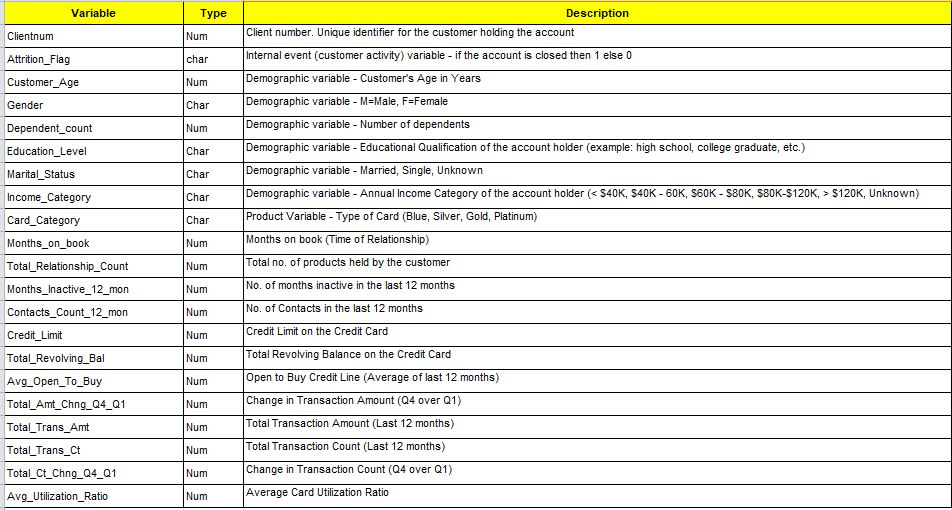

### Visualization

Create bar graph of value counts for every column with data type 'object'

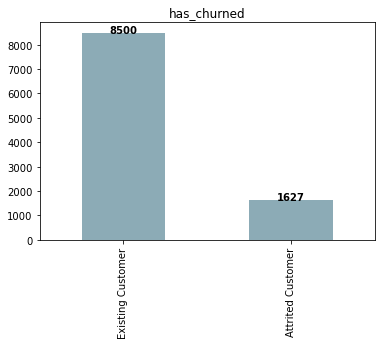

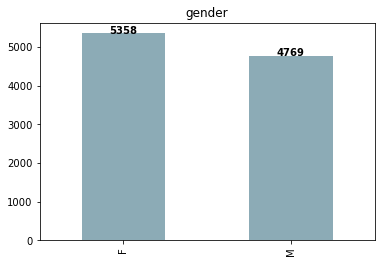

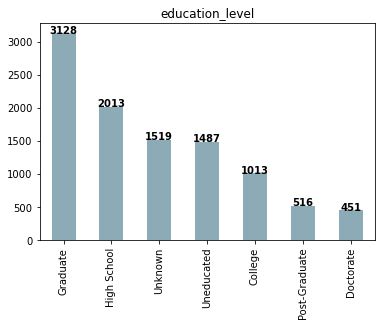

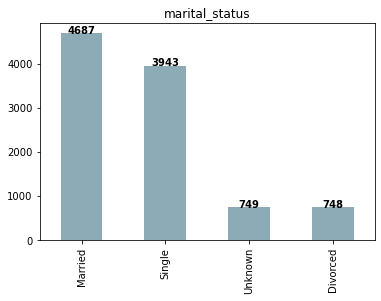

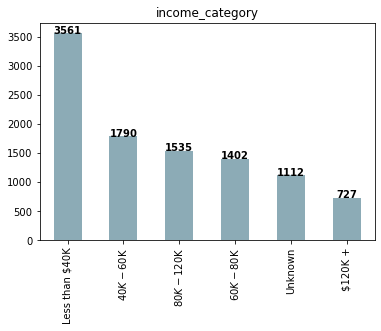

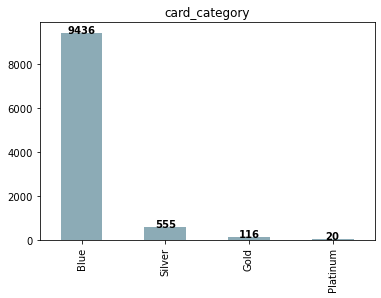

In [5]:
for col in df.select_dtypes(include='object').columns:
    plt.figure()
    ax = df[col].value_counts().plot(kind='bar',color = '#8cabb6')
    for i, v in df[col].value_counts().reset_index().iterrows():
        ax.text(i, v[col] + 0.5, str(v[col]), ha='center', fontweight='bold')
    # column name
    plt.title(col)

plt.show()

Create boxplot for every column with data type 'integer'

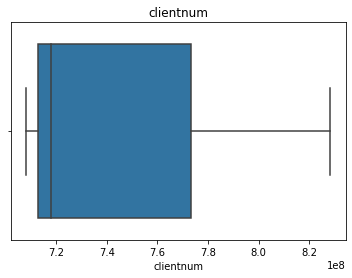

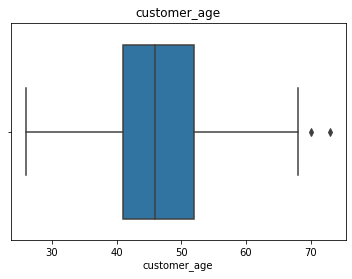

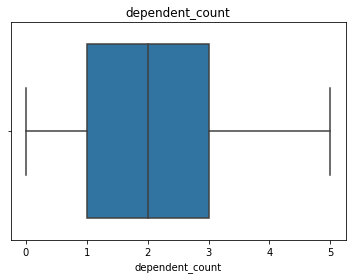

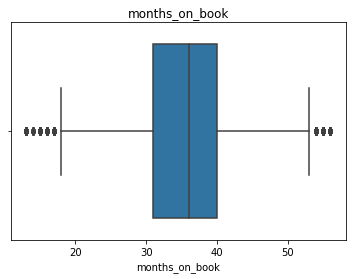

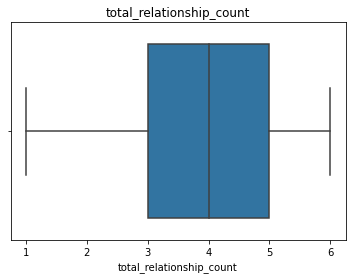

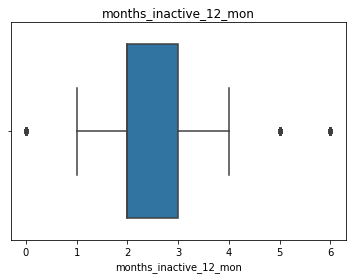

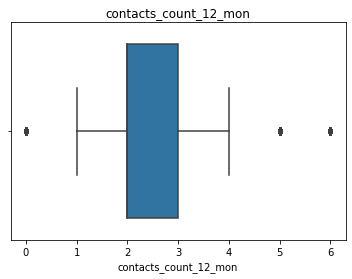

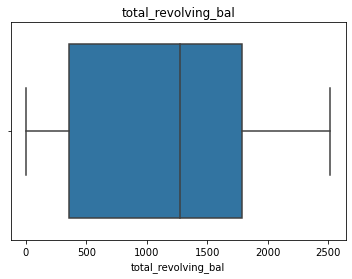

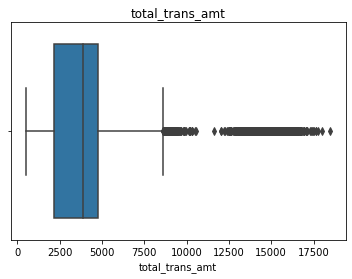

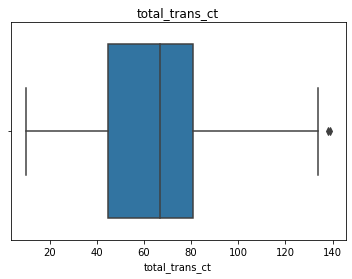

In [6]:
for col in df.select_dtypes(include='integer').columns:
    plt.figure()
    ax = sns.boxplot(x=df[col])
    plt.title(col)

plt.show()

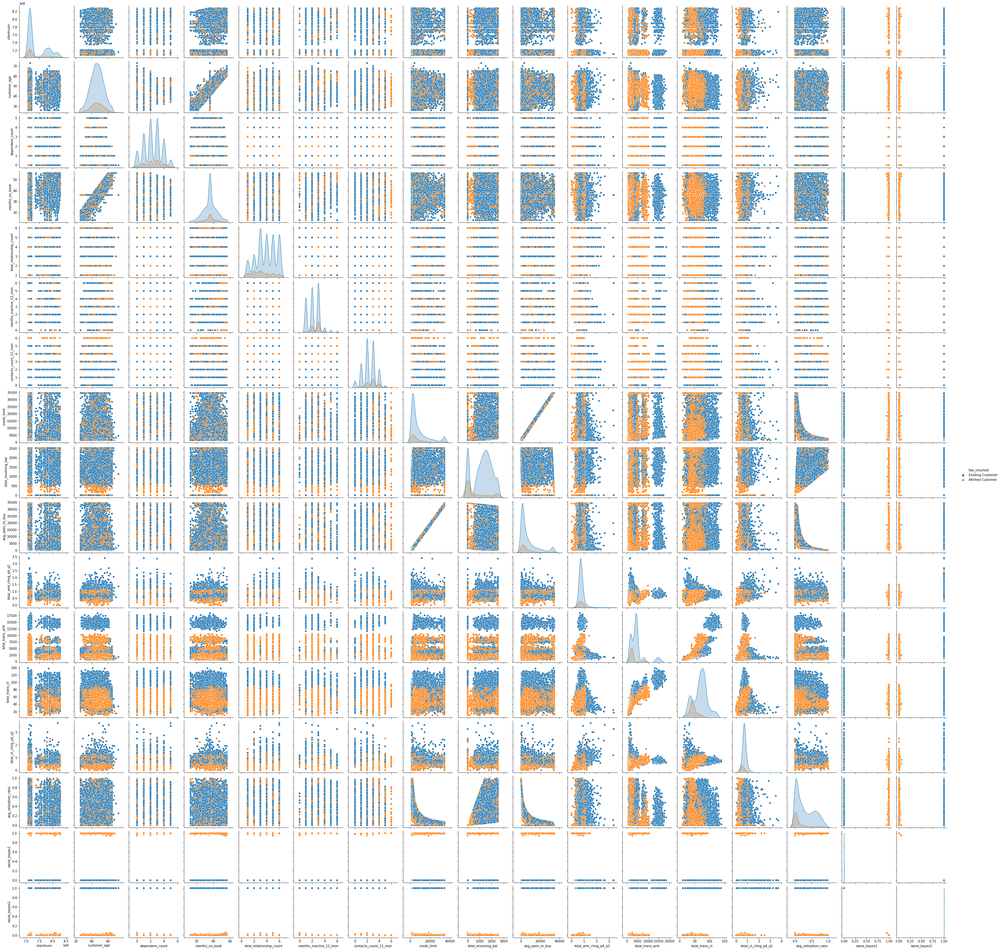

In [7]:
sns.pairplot(df, hue='has_churned')

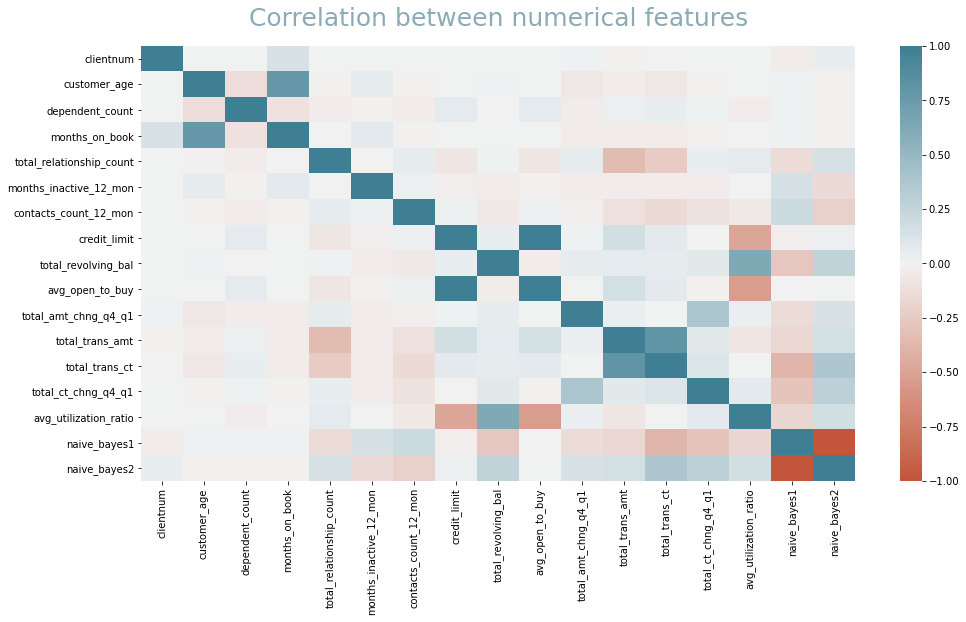

In [8]:
heat = df.corr()
plt.figure(figsize = [16,8])
plt.title("Correlation between numerical features", size = 25, pad = 20, color = '#8cabb6')
sns.heatmap(heat, cmap = sns.diverging_palette(20, 220, n = 200), annot = False)
plt.show()

'Avg_open_to_buy' and 'Credit_Limit' are highly correlated.

'Total_Trans_Amt' and 'Total_Trans_Ct' are closely correlated.

'Credit_Limit', 'Total_Revolving_Bal', and 'Avg_open_to_buy' all seem to be connect to the 'Avg_Utilization_Ratio'.

<function matplotlib.pyplot.show(close=None, block=None)>

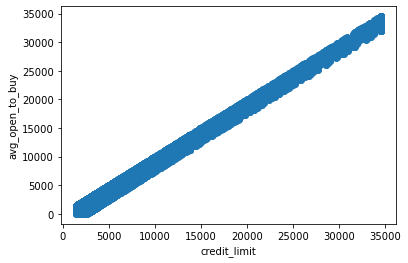

In [9]:
#exploring the above findings
plt.scatter(df['credit_limit'], df['avg_open_to_buy'])
plt.xlabel('credit_limit')
plt.ylabel('avg_open_to_buy') 
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

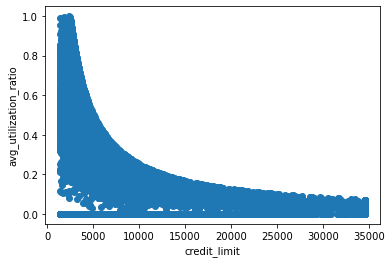

In [10]:
plt.scatter(df['credit_limit'], df['avg_utilization_ratio'])
plt.xlabel('credit_limit')
plt.ylabel('avg_utilization_ratio') 
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

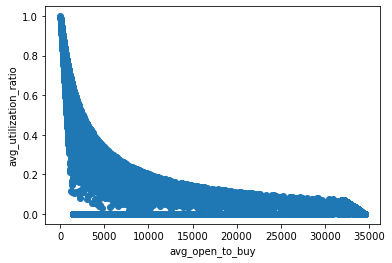

In [11]:
plt.scatter(df['avg_open_to_buy'], df['avg_utilization_ratio'])
plt.xlabel('avg_open_to_buy')
plt.ylabel('avg_utilization_ratio') 
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

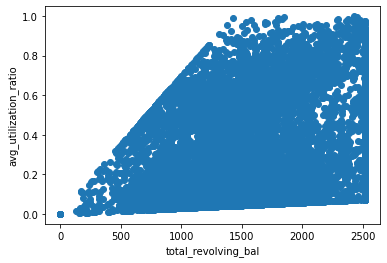

In [12]:
plt.scatter(df['total_revolving_bal'], df['avg_utilization_ratio'])
plt.xlabel('total_revolving_bal')
plt.ylabel('avg_utilization_ratio') 
plt.show

Text(0, 0.5, 'total_trans_ct')

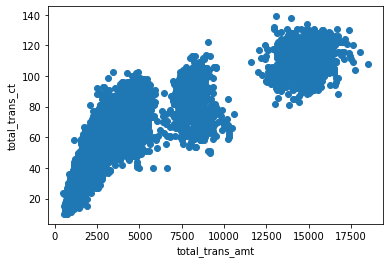

In [13]:
# is the total transaction amount connected to the total transaction count
plt.scatter(df['total_trans_amt'], df['total_trans_ct'])
plt.xlabel('total_trans_amt')
plt.ylabel('total_trans_ct') 

# Credit Limit Prediction

Linear Regression for Credit Limit Prediction

In [14]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

data = df.copy()
data = pd.get_dummies(data, drop_first=True)

X = data.drop(["credit_limit","avg_open_to_buy"], axis=1)  # Features
y = data["credit_limit"]  # Target variable

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

regressor = LinearRegression()
regressor.fit(X_train, y_train)

y_pred = regressor.predict(X_test)

mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print("Mean Squared Error: ", mse)
print("R2 Score: ", r2)

Mean Squared Error:  28656274.669112395
R2 Score:  0.6571407743605073


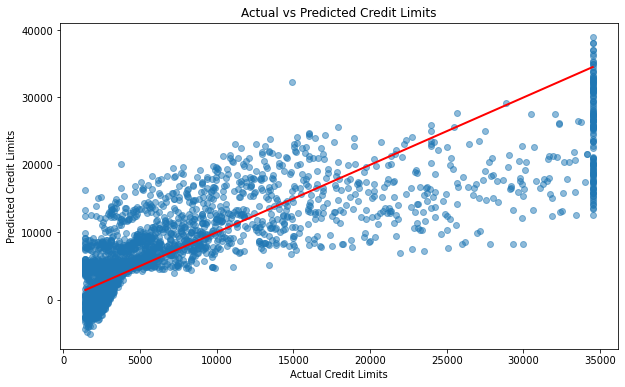

In [15]:
import numpy as np

plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, alpha=0.5)
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linewidth=2) # 对角线
plt.xlabel("Actual Credit Limits")
plt.ylabel("Predicted Credit Limits")
plt.title("Actual vs Predicted Credit Limits")
plt.show()

The MSE score here is very big 28656274.669112395. It means that the predictions made by the linear regression model are significanly different from the actual credit limit values in the test set. 

Based on our opinion, this case happened because of:
- insufficient or irrelavant features. The features we used may not be that relevant for predicting credit limits.
- Non-linearity. The relation between features and targets we used may not be linear.
- Outliers

# Churn Prediction

### Pre-Processing

we are using the column 'Attrition_Flag' to know whether a customer has churned or not. 

if it is said 'Attrited Customer' it means that the customer has stopped using the credit card. On the other hand, if it is written 'Existing Customer', the customer is still an active user of the credit card.

Now I want to rename the column, if the customer has churned, change to integer 1, if has not, change to 0. 

We also rename Male as 1 and Female as 0

In [16]:
# make gender and outcome numerical
df['has_churned'] = df['has_churned'].replace({'Attrited Customer': 1, 'Existing Customer': 0})
df['gender'] = df['gender'].replace({'M':1,'F':0})

# drop client id and naive_bayes
df = df.drop({'clientnum','naive_bayes1','naive_bayes2'}, axis = 1)
df

,has_churned,customer_age,gender,dependent_count,education_level,marital_status,income_category,card_category,months_on_book,total_relationship_count,months_inactive_12_mon,contacts_count_12_mon,credit_limit,total_revolving_bal,avg_open_to_buy,total_amt_chng_q4_q1,total_trans_amt,total_trans_ct,total_ct_chng_q4_q1,avg_utilization_ratio
0,0,45,1,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,0,49,0,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,0,51,1,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,0,40,0,4,High School,Unknown,Less than $40K,Blue,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,0,40,1,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10122,0,50,1,2,Graduate,Single,$40K - $60K,Blue,40,3,2,3,4003.0,1851,2152.0,0.703,15476,117,0.857,0.462
10123,1,41,1,2,Unknown,Divorced,$40K - $60K,Blue,25,4,2,3,4277.0,2186,2091.0,0.804,8764,69,0.683,0.511
10124,1,44,0,1,High School,Married,Less than $40K,Blue,36,5,3,4,5409.0,0,5409.0,0.819,10291,60,0.818,0.000
10125,1,30,1,2,Graduate,Unknown,$40K - $60K,Blue,36,4,3,3,5281.0,0,5281.0,0.535,8395,62,0.722,0.000


In [17]:
counts = df.has_churned.value_counts()
print(counts)
perc_churn = (counts[1] / (counts[0] + counts[1])) * 100
print("Churn Rate = %.1f %%"%(perc_churn))

0    8500
1    1627
Name: has_churned, dtype: int64
Churn Rate = 16.1 %


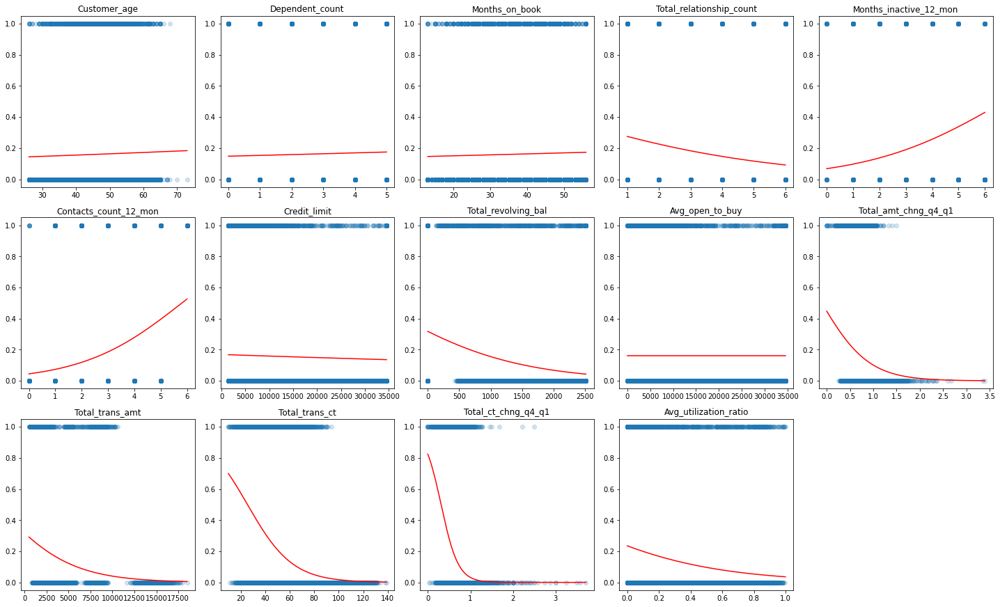

In [18]:
# create a list of column names to plot
cols_to_plot = ['customer_age', 'dependent_count', 'months_on_book',
                'total_relationship_count', 'months_inactive_12_mon', 'contacts_count_12_mon', 'credit_limit',
                'total_revolving_bal', 'avg_open_to_buy', 'total_amt_chng_q4_q1', 'total_trans_amt', 'total_trans_ct',
                'total_ct_chng_q4_q1', 'avg_utilization_ratio']
#               'naive_bayes1','naive_bayes2']

# set up the figure and subplots
fig, axes = plt.subplots(nrows=4, ncols=5, figsize=(20, 16))
axes = axes.flatten()

# loop through each column and plot the logistic regression curve
for i, col in enumerate(cols_to_plot):
    x = df[col]
    y = df['has_churned']
    
    # fit the logistic regression model
    from sklearn.linear_model import LogisticRegression
    model = LogisticRegression()
    model.fit(x.values.reshape(-1, 1), y)
    
    # create a range of values to predict for the curve
    x_range = np.linspace(x.min(), x.max(), 1000)
    y_range = model.predict_proba(x_range.reshape(-1, 1))[:, 1]
    
    # plot the curve
    axes[i].scatter(x, y, alpha=0.2)
    axes[i].plot(x_range, y_range, color='red')
    axes[i].set_title(col.capitalize())
    
# remove extra subplots
for i in range(len(cols_to_plot), len(axes)):
    fig.delaxes(axes[i])
    
plt.tight_layout()
plt.show()

In [19]:
# Code adapted from: https://www.kaggle.com/code/andreshg/churn-prediction-0-99-auc-h2o-sklearn-smote#2.-Feature-Engeneering
catcols = df.select_dtypes(exclude = ['int64','float64']).columns
intcols = df.select_dtypes(include = ['int64']).columns #int value
floatcols = df.select_dtypes(include = ['Float64']).columns #float value

# one-hot encoding on categorical columns
df = pd.get_dummies(df, columns = catcols)

# minmax scaling numeric features 
for col in df[floatcols]:
    df[col] = MinMaxScaler().fit_transform(df[[col]])
    
for col in df[intcols]:
    df[col] = MinMaxScaler().fit_transform(df[[col]])
    
print('New Number of Features: %d'%(df.shape[1]))  

New Number of Features: 37


In [20]:
# split into X and y
X = df.drop('has_churned', axis = 1)
y = df['has_churned']

In [21]:
display(X)

,customer_age,gender,dependent_count,months_on_book,total_relationship_count,months_inactive_12_mon,contacts_count_12_mon,credit_limit,total_revolving_bal,avg_open_to_buy,...,income_category_$120K +,income_category_$40K - $60K,income_category_$60K - $80K,income_category_$80K - $120K,income_category_Less than $40K,income_category_Unknown,card_category_Blue,card_category_Gold,card_category_Platinum,card_category_Silver
0,0.404255,1.0,0.6,0.604651,0.8,0.166667,0.500000,0.340190,0.308701,0.345116,...,0,0,1,0,0,0,1,0,0,0
1,0.489362,0.0,1.0,0.720930,1.0,0.166667,0.333333,0.206112,0.343266,0.214093,...,0,0,0,0,1,0,1,0,0,0
2,0.531915,1.0,0.6,0.534884,0.6,0.166667,0.000000,0.059850,0.000000,0.098948,...,0,0,0,1,0,0,1,0,0,0
3,0.297872,0.0,0.8,0.488372,0.4,0.666667,0.166667,0.056676,1.000000,0.022977,...,0,0,0,0,1,0,1,0,0,0
4,0.297872,1.0,0.6,0.186047,0.8,0.166667,0.000000,0.099091,0.000000,0.136557,...,0,0,1,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10122,0.510638,1.0,0.4,0.627907,0.4,0.333333,0.500000,0.077536,0.735399,0.062266,...,0,1,0,0,0,0,1,0,0,0
10123,0.319149,1.0,0.4,0.279070,0.6,0.333333,0.500000,0.085819,0.868494,0.060499,...,0,1,0,0,0,0,1,0,0,0
10124,0.382979,0.0,0.2,0.534884,0.8,0.500000,0.666667,0.120042,0.000000,0.156637,...,0,0,0,0,1,0,1,0,0,0
10125,0.085106,1.0,0.4,0.534884,0.6,0.500000,0.500000,0.116172,0.000000,0.152928,...,0,1,0,0,0,0,1,0,0,0


### Feature Selection

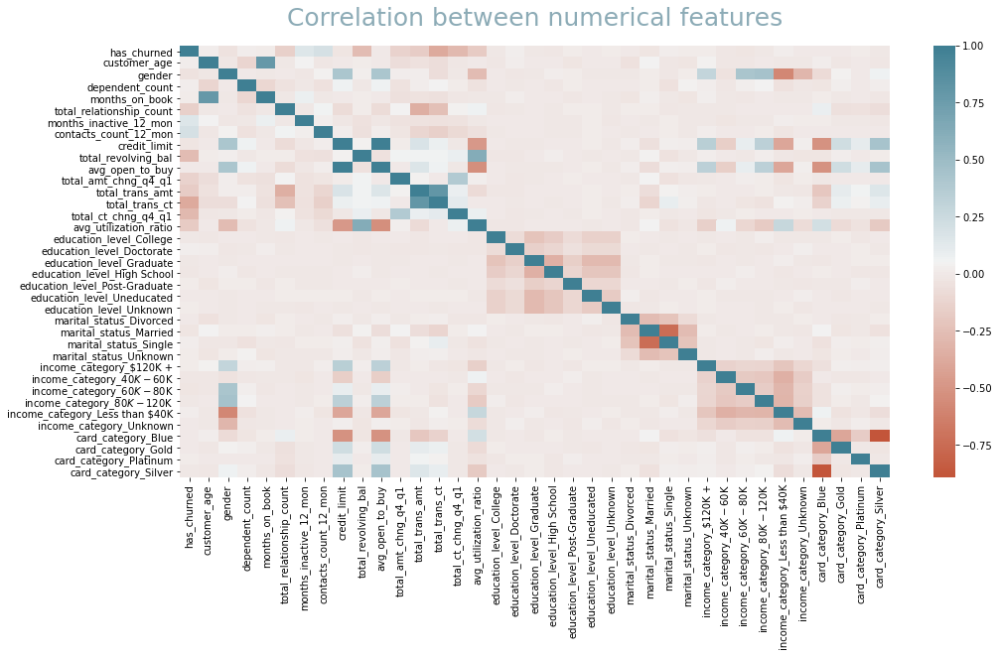

In [22]:
#Correlation Coefficients Ranking
heat = df.corr()
plt.figure(figsize=[16,8])
plt.title("Correlation between numerical features", size = 25, pad = 20, color = '#8cabb6')
sns.heatmap(heat,cmap = sns.diverging_palette(20, 220, n = 200), annot=False)
plt.show()

In [23]:
# Code adapted from: https://www.kaggle.com/code/winternguyen/churning-customers-98-95-detected#Step-4:-Feature-Selection

print("Correlation Coefficient of all the Features vs has_churned")
corr = df.corr()
corr.sort_values(["has_churned"], ascending = False, inplace = True)
correlations = corr.has_churned
a = correlations[correlations > 0.1]
b = correlations[correlations < -0.1]
top_corr_features = a.append(b)
top_corr_features

Correlation Coefficient of all the Features vs has_churned


has_churned                 1.000000
contacts_count_12_mon       0.204491
months_inactive_12_mon      0.152449
total_amt_chng_q4_q1       -0.131063
total_relationship_count   -0.150005
total_trans_amt            -0.168598
avg_utilization_ratio      -0.178410
total_revolving_bal        -0.263053
total_ct_chng_q4_q1        -0.290054
total_trans_ct             -0.371403
Name: has_churned, dtype: float64

### Look at the best performing features in 3 ensemble models

ignore naive_bayes1

In [24]:
# Code adapted from: https://www.kaggle.com/code/andreshg/churn-prediction-0-99-auc-h2o-sklearn-smote#4.-Feature-Selection

def plot_importances(model, model_name, features_to_plot, feature_names):
    #fit model and performances
    model.fit(X,y)
    importances = model.feature_importances_
    
    # sort and rank importances
    indices = np.argsort(importances)
    best_features = np.array(feature_names)[indices][-features_to_plot:]
    values = importances[indices][-features_to_plot:]
    
    # plot a graph
    y_ticks = np.arange(0, features_to_plot)
    fig, ax = plt.subplots()
    ax.barh(y_ticks, values, color = '#b2c4cc')
    ax.set_yticklabels(best_features)
    ax.set_yticks(y_ticks)
    ax.set_title("%s Feature Importances"%(model_name))
    fig.tight_layout()
    plt.show()
    
def best_features(model, features_to_plot, feature_names):
    # get list of best features 
    model.fit(X,y)
    importances = model.feature_importances_

    indices = np.argsort(importances)
    best_features = np.array(feature_names)[indices][-features_to_plot:]
    return best_features

<ipython-input-24-71151ea40a7d>:17: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(best_features)


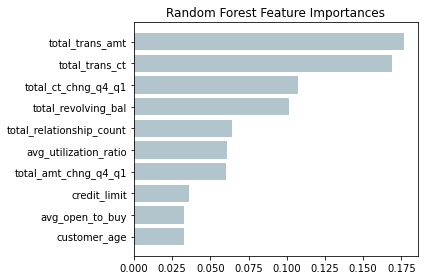

<ipython-input-24-71151ea40a7d>:17: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(best_features)


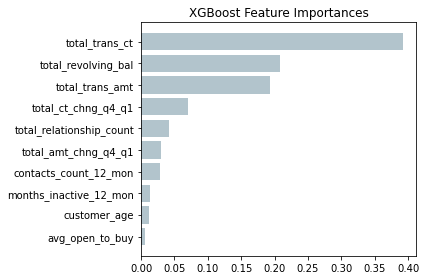

<ipython-input-24-71151ea40a7d>:17: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(best_features)


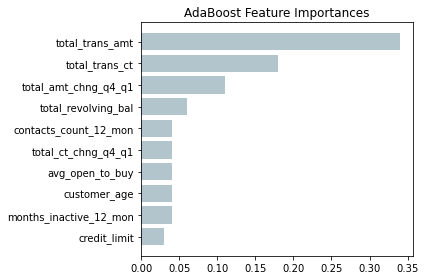

In [25]:
feature_names = list(X.columns)

model1 = RandomForestClassifier(random_state = 1234)
plot_importances(model1, 'Random Forest', 10, feature_names)

model2 = GradientBoostingClassifier(n_estimators = 100, learning_rate = 1.0, max_depth = 1, random_state = 0)
plot_importances(model2, 'XGBoost', 10, feature_names)

model3 = AdaBoostClassifier(n_estimators = 100, learning_rate = 1.0, random_state = 0)
plot_importances(model3, 'AdaBoost', 10, feature_names)

#### Using selectkbest to find the best parameters

In [26]:
# looking at the F-value between label/feature for classification tasks
f_selector = SelectKBest(f_classif, k=10)
X_selected = f_selector.fit_transform(X, y)
mask = f_selector.get_support()
f_selector_best = X.columns[mask]
print(f_selector_best)

Index(['gender', 'total_relationship_count', 'months_inactive_12_mon',
       'contacts_count_12_mon', 'total_revolving_bal', 'total_amt_chng_q4_q1',
       'total_trans_amt', 'total_trans_ct', 'total_ct_chng_q4_q1',
       'avg_utilization_ratio'],
      dtype='object')


In [27]:
forest_best = list(best_features(model1, 10, feature_names))
XG_best = list(best_features(model2, 10, feature_names))
ada_best = list(best_features(model3, 10, feature_names))
top_corr_features = list(top_corr_features.index[1:])
f_selector_best = list(f_selector_best)

In [28]:
best_features_overall = forest_best + XG_best + ada_best + top_corr_features + f_selector_best

# create a dictionary with the number of times features appear 
from collections import Counter
count_best_features = dict(Counter(best_features_overall))

# list of the features without any repeatitions
features_no_repeats = list(dict.fromkeys(best_features_overall))

display(count_best_features)

{'customer_age': 3,
 'avg_open_to_buy': 3,
 'credit_limit': 2,
 'total_amt_chng_q4_q1': 5,
 'avg_utilization_ratio': 3,
 'total_relationship_count': 4,
 'total_revolving_bal': 5,
 'total_ct_chng_q4_q1': 5,
 'total_trans_ct': 5,
 'total_trans_amt': 5,
 'months_inactive_12_mon': 4,
 'contacts_count_12_mon': 4,
 'gender': 1}

#### the count mean that the occurence of the feature in the 'best_feature_overall' list

In [29]:
# get list of features with high counts in the dictionary
def get_features(threshold):
    # remove features below a certain number of appearances
    chosen_features = []
    for i in features_no_repeats:
        if count_best_features[i] > threshold:
            chosen_features.append(i)
    return chosen_features

In [30]:
chosen_features = get_features(2)
chosen_features.remove('avg_open_to_buy')
chosen_features.remove('avg_utilization_ratio')
chosen_features

['customer_age',
 'total_amt_chng_q4_q1',
 'total_relationship_count',
 'total_revolving_bal',
 'total_ct_chng_q4_q1',
 'total_trans_ct',
 'total_trans_amt',
 'months_inactive_12_mon',
 'contacts_count_12_mon']

In [31]:
def eval_model(model, model_name, X, y, threshold):
    # make X the chosen subset
    chosen_features = get_features(threshold)
    X = X[chosen_features]
    
    train_x, test_x, train_y, test_y = train_test_split(X, y, test_size = 0.25, random_state = 42)
    
    # fit model
    model.fit(train_x,train_y)
    model.score(test_x, test_y)
    pred_test = model.predict(test_x)
    
    # get metrics
    f1 = metrics.f1_score(test_y, pred_test)
    test_acc = metrics.accuracy_score(test_y, pred_test)
    con = metrics.confusion_matrix(test_y, pred_test)
    auc_roc = roc_auc_score(test_y, pred_test)
    mse = metrics.mean_squared_error(test_y, pred_test)
    
    print(con,'%s model with %s threshold: %.4f F1-score, %.4f accuracy, %.4f AUC-ROC, and %.4f MSE' % (model_name, threshold, f1, test_acc, auc_roc, mse))

Model name: It refers to the specific algorithm or method used to build the model, such as logistic regression, decision tree, random forest, etc.

Threshold value: It's a parameter used in classification models to determine the probability threshold for predicting a binary outcome (e.g., 0 or 1). Values above the threshold are predicted as positive, while values below the threshold are predicted as negative. The threshold value can be adjusted to trade off between precision and recall.

F1-score: It's a measure of a model's accuracy that takes into account both precision and recall. It's calculated as the harmonic mean of precision and recall and ranges from 0 to 1, with higher values indicating better performance.

Accuracy: It's a measure of a model's performance that calculates the proportion of correct predictions over the total number of predictions. It's expressed as a percentage and ranges from 0 to 100, with higher values indicating better performance.

AUC-ROC: It stands for Area Under the Receiver Operating Characteristic curve, which is a plot of the true positive rate against the false positive rate at various probability thresholds. AUC-ROC is a measure of a model's ability to distinguish between positive and negative samples and ranges from 0 to 1, with higher values indicating better performance.

### Logistic

In [32]:
model = LogisticRegression(random_state=1)
eval_model(model, 'Logistic', X, y, 2)

[[2059   54]
 [ 217  202]] Logistic model with 2 threshold: 0.5985 F1-score, 0.8930 accuracy, 0.7283 AUC-ROC, and 0.1070 MSE


the confusion matrix shows that:

- There were 2059 true negatives (TN), meaning that the model correctly predicted 2059 customers who did not churn.

- There were 54 false positives (FP), meaning that the model incorrectly predicted 54 customers who did not churn as churned.

- There were 217 false negatives (FN), meaning that the model incorrectly predicted 217 customers who churned as not churned.

- There were 202 true positives (TP), meaning that the model correctly predicted 202 customers who churned.

the model correctly predicted the positive and negative classes with high accuracy and a reasonable trade-off between precision and recall.

However, I also tried to predict the churn using K-Nearest Neighbor:

### KNN

In [33]:
model2 = BaggingClassifier(KNeighborsClassifier(n_neighbors = 7), max_samples = 0.8, max_features = 0.8)

eval_model(model2, 'KNN', X, y, 2)

[[2085   28]
 [ 201  218]] KNN model with 2 threshold: 0.6556 F1-score, 0.9096 accuracy, 0.7535 AUC-ROC, and 0.0904 MSE


the confusion matrix shows that:

- There were 2079 true negatives (TN), meaning that the model correctly predicted 2079 customers who did not churn.

- There were 34 false positives (FP), meaning that the model incorrectly predicted 34 customers who did not churn as churned.

- There were 163 false negatives (FN), meaning that the model incorrectly predicted 163 customers who churned as not churned.

- There were 256 true positives (TP), meaning that the model correctly predicted 256 customers who churned.


the KNN model has a higher accuracy and F-1 compared to the logistic regression, which also means that it can predict the customer churn rate better.

### Decision Tree

In [34]:
# create decision tree regressor with default hyperparameters
dt = DecisionTreeRegressor(random_state=42)

# evaluate model with eval_model function
eval_model(dt, "Decision Tree Regressor", X, y, 2)

[[2032   81]
 [  86  333]] Decision Tree Regressor model with 2 threshold: 0.7995 F1-score, 0.9340 accuracy, 0.8782 AUC-ROC, and 0.0660 MSE


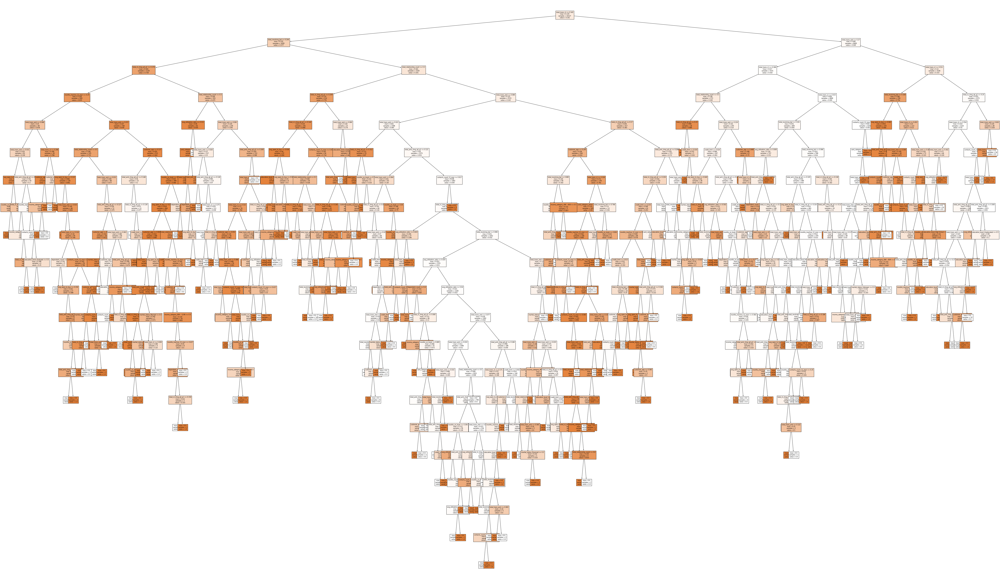

In [35]:
# fit the model
dt.fit(X, y)

plt.figure(figsize=(100,60))
plot_tree(dt, filled=True, feature_names=X.columns, fontsize=8)
plt.show()

the confusion matrix shows that:

There were 2032 true negatives (TN), meaning that the model correctly predicted 2079 customers who did not churn.

There were 81 false positives (FP), meaning that the model incorrectly predicted 34 customers who did not churn as churned.

There were 86 false negatives (FN), meaning that the model incorrectly predicted 163 customers who churned as not churned.

There were 333 true positives (TP), meaning that the model correctly predicted 256 customers who churned.

the KNN model has a higher accuracy and F-1 compared to the logistic and KNN regression, which also means that it can predict the customer churn rate better.

### Random Forest

In [36]:
forest = RandomForestClassifier(n_estimators = 100, max_depth = 15, random_state = 750)
eval_model(forest, 'forest', X, y, 2)

[[2090   23]
 [  64  355]] forest model with 2 threshold: 0.8908 F1-score, 0.9656 accuracy, 0.9182 AUC-ROC, and 0.0344 MSE


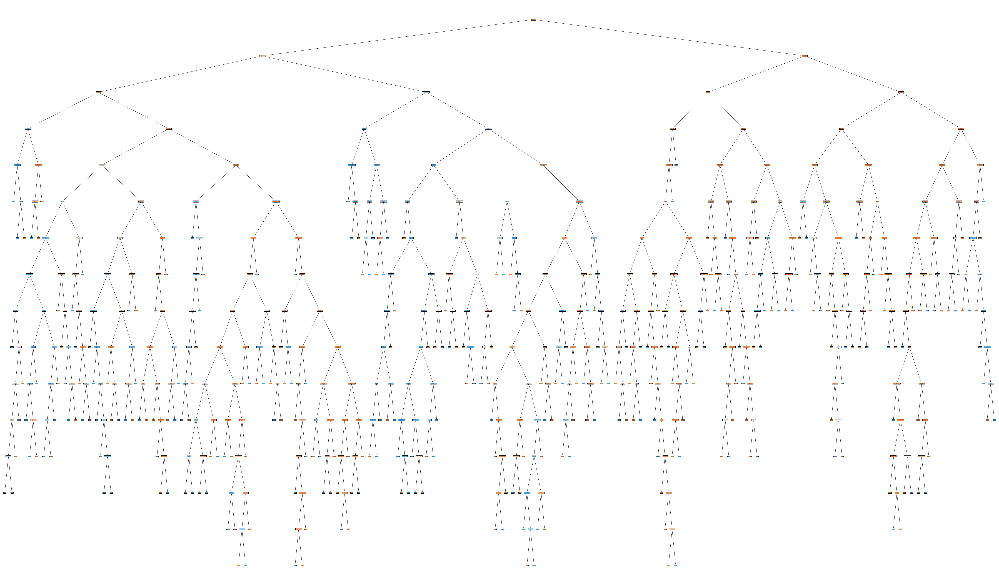

In [37]:
# extract the first decision tree from the trained random forest
tree = forest.estimators_[0]

# plot the decision tree
plt.figure(figsize=(100,60))
plot_tree(tree, feature_names=X.columns, class_names=['0', '1'], filled=True)
plt.show()

the confusion matrix shows that:

- There were 2090 true negatives (TN), meaning that the model correctly predicted 2079 customers who did not churn.

- There were 23 false positives (FP), meaning that the model incorrectly predicted 34 customers who did not churn as churned.

- There were 64 false negatives (FN), meaning that the model incorrectly predicted 163 customers who churned as not churned.

- There were 355 true positives (TP), meaning that the model correctly predicted 256 customers who churned.

Based on the test above, random forest is the best performing model, so we will hypertune these parameters.

*Hyperparameter tuning is the process of selecting the optimal set of hyperparameters for a machine learning model

In [38]:
forest = RandomForestClassifier(n_estimators = 850, max_depth = 19, random_state = 1200)

In [39]:
chosen_features = get_features(2)
chosen_features.remove('avg_open_to_buy')
chosen_features.remove('avg_utilization_ratio')
X_new = X[chosen_features]

train_x, test_x, train_y, test_y = train_test_split(X_new, y, test_size = 0.25, random_state = 42)
    
forest.fit(train_x,train_y)
forest.score(test_x, test_y)
pred_test = forest.predict(test_x)
    
f1 = metrics.f1_score(test_y, pred_test)
test_acc = metrics.accuracy_score(test_y, pred_test)
con = metrics.confusion_matrix(test_y, pred_test)
precision = metrics.precision_score(test_y, pred_test)
recall = metrics.recall_score(test_y, pred_test)
roc = metrics.roc_auc_score(test_y, pred_test)
mse = mean_squared_error(test_y, pred_test)

In [40]:
print('Accuracy Score', test_acc)
print('Precision', precision)
print('Recall', recall)
print('F1-Score', f1)
print('ROC Score', roc)
print('MSE Score:', mse)
print(con)

Accuracy Score 0.9664296998420221
Precision 0.9304123711340206
Recall 0.8615751789976134
F1-Score 0.8946716232961587
ROC Score 0.9243985691485936
MSE Score: 0.033570300157977885
[[2086   27]
 [  58  361]]


Validate between training and test set using cross_validate function

In [41]:
#cross validation
from sklearn.model_selection import cross_validate 

cv_results = cross_validate(forest, X_new, y, scoring = ('f1', 'accuracy', 'roc_auc'), cv = 8)
sorted(cv_results.keys())

['fit_time', 'score_time', 'test_accuracy', 'test_f1', 'test_roc_auc']

'fit_time': the time taken to fit the model on each training set.

'score_time': the time taken to score the model on each validation set.

'test_accuracy': the accuracy score of the model on each validation set.

'test_f1': the F1 score of the model on each validation set.

'test_roc_auc': the area under the receiver operating characteristic (ROC) curve of the model on each validation set.

In [42]:
cv_results['test_roc_auc'] 

array([0.91056078, 0.96866615, 0.98541168, 0.9918462 , 0.99539807,
       0.99796213, 0.8989536 , 0.90523967])

Each value represents the area under the receiver operating characteristic (ROC) curve for a particular fold of the cross-validation. A high ROC AUC score indicates that the model is able to distinguish well between the positive and negative examples. In this case, the scores range from 0.898 to 0.998, with higher values indicating better performance.

In [43]:
cv_results['test_f1'] 

array([0.60892388, 0.82324455, 0.89047619, 0.8814433 , 0.89189189,
       0.921875  , 0.78450363, 0.74285714])

The cv_results['test_f1'] array provides a summary of the model's performance across all folds of the cross-validation process for the F1-score metric. The scores range from 0.609 to 0.922, with higher values indicating better performance.

In [44]:
cv_results['test_accuracy'] 

array([0.88230648, 0.94233807, 0.96366509, 0.96366509, 0.96840442,
       0.97630332, 0.92969984, 0.92885375])

The array shows the accuracy score of the 8-fold cross-validation

#### Conclusion

Random Forest outperformed the other models in this analysos. This is because Random Forest is an ensemble method that combines multiple decision trees, each with a different subset of features and training data to make predictions. This helps to reduce overfitting and improve the model's ability to generalize to new data.

K-nearest neighbor (KNN) and decision tree models also performed well, but not as well as Random Forest. KNN is a non-parametric model that uses distance metrics to find the k closest training examples to the test example and predicts the class based on the majority of the neighbors. Decision tree models recursively partition the feature space into smaller regions based on the feature that provides the most information gain, and then predict the class based on the majority of the training examples in each region.

Logistic regression had the lowest F1-score and accuracy among the models. This could be because it is a linear model that assumes a linear relationship between the input features and the output, which may not be true for this dataset. In contrast, the other models are non-linear and can capture more complex relationships between the features and the output.